In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import torch
import torchvision.datasets as datasets

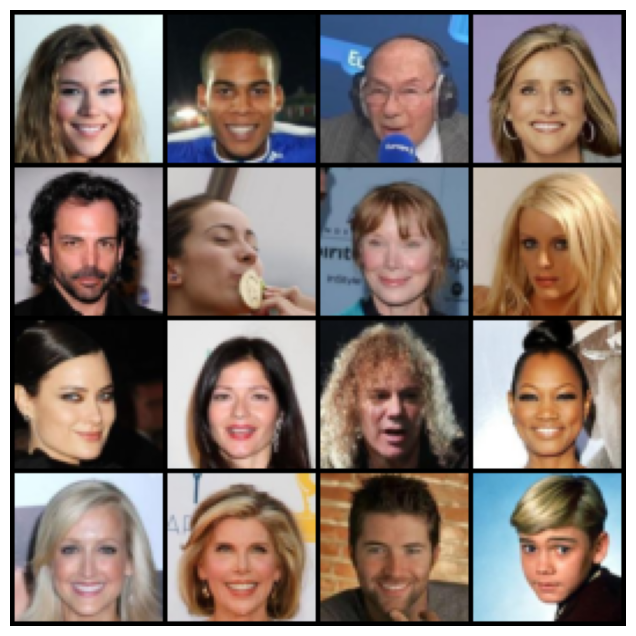

100%|██████████| 1583/1583 [04:53<00:00,  5.39it/s]


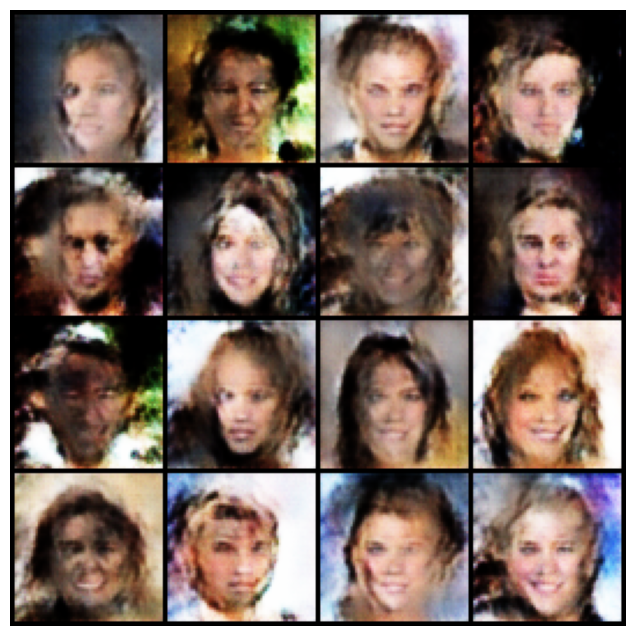

Epoch [1/20] | D Loss: 0.5237 | G Loss: 4.6509


100%|██████████| 1583/1583 [02:17<00:00, 11.54it/s]


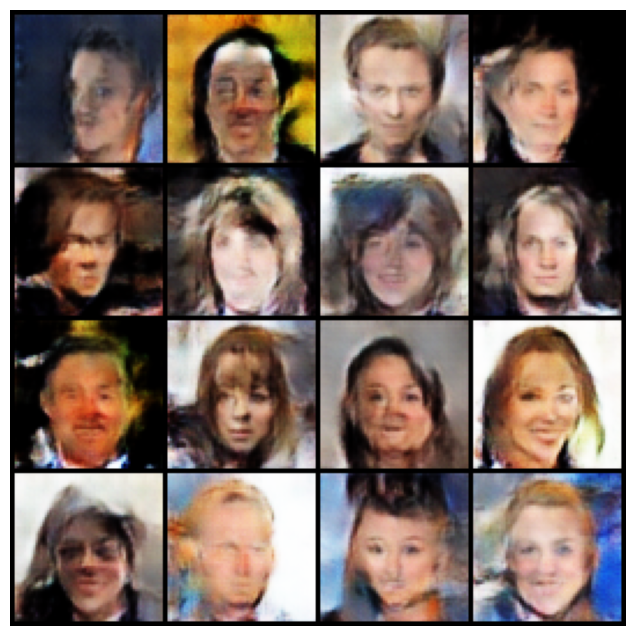

Epoch [2/20] | D Loss: 0.4162 | G Loss: 4.2372


100%|██████████| 1583/1583 [02:11<00:00, 12.02it/s]


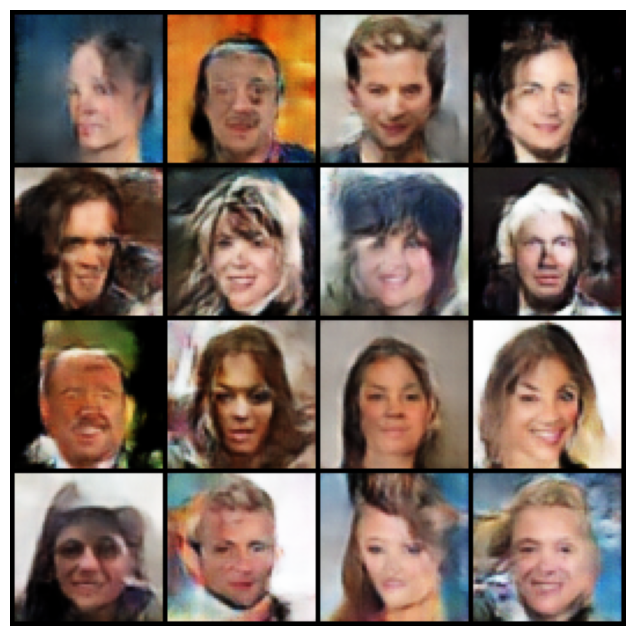

Epoch [3/20] | D Loss: 0.1896 | G Loss: 2.8064


100%|██████████| 1583/1583 [02:10<00:00, 12.14it/s]


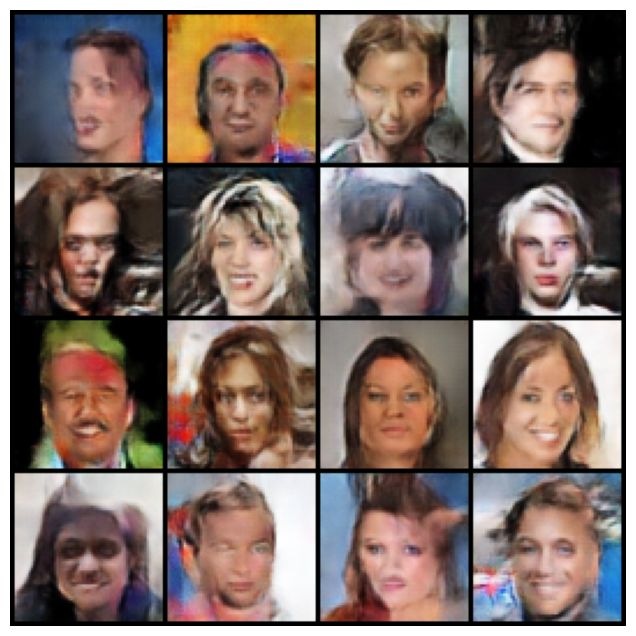

Epoch [4/20] | D Loss: 0.7099 | G Loss: 7.5963


100%|██████████| 1583/1583 [02:07<00:00, 12.37it/s]


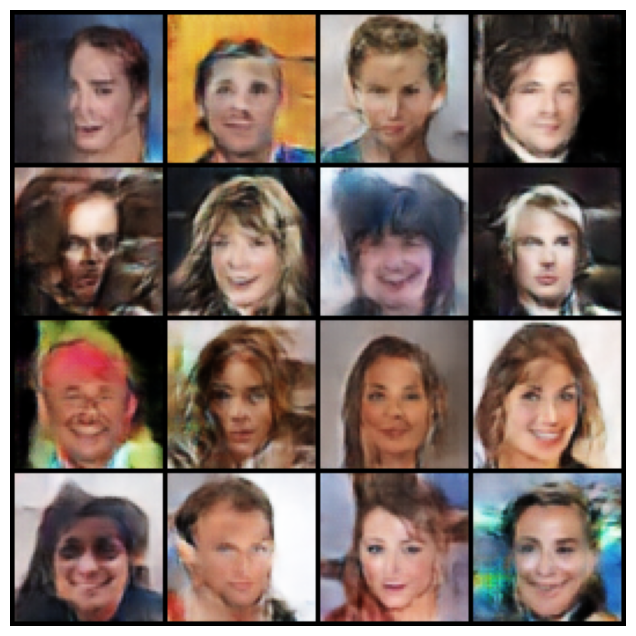

Epoch [5/20] | D Loss: 0.2108 | G Loss: 3.9273


100%|██████████| 1583/1583 [02:08<00:00, 12.33it/s]


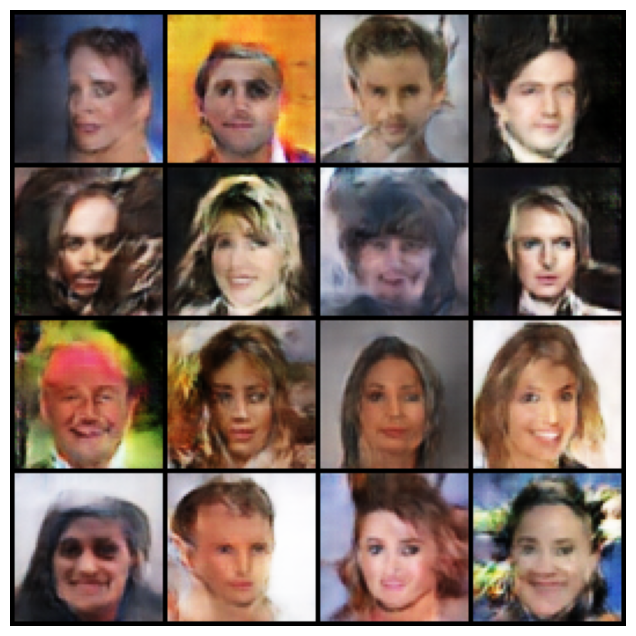

Epoch [6/20] | D Loss: 0.4938 | G Loss: 3.7304


100%|██████████| 1583/1583 [02:07<00:00, 12.39it/s]


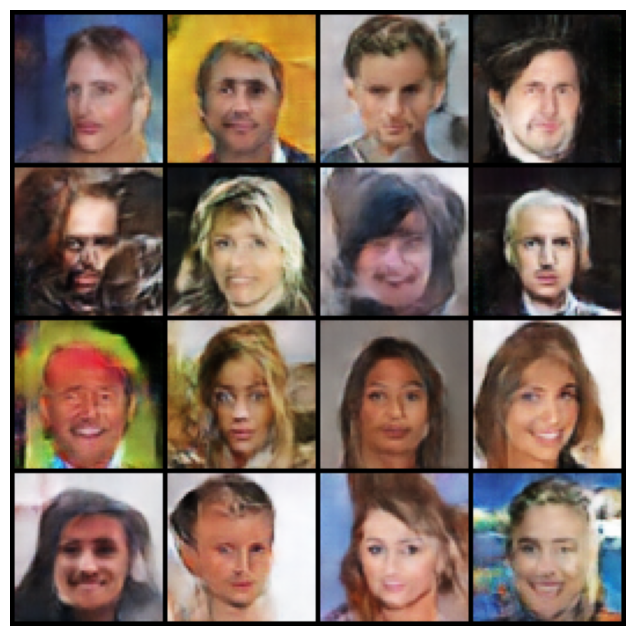

Epoch [7/20] | D Loss: 0.0993 | G Loss: 4.2879


100%|██████████| 1583/1583 [02:08<00:00, 12.33it/s]


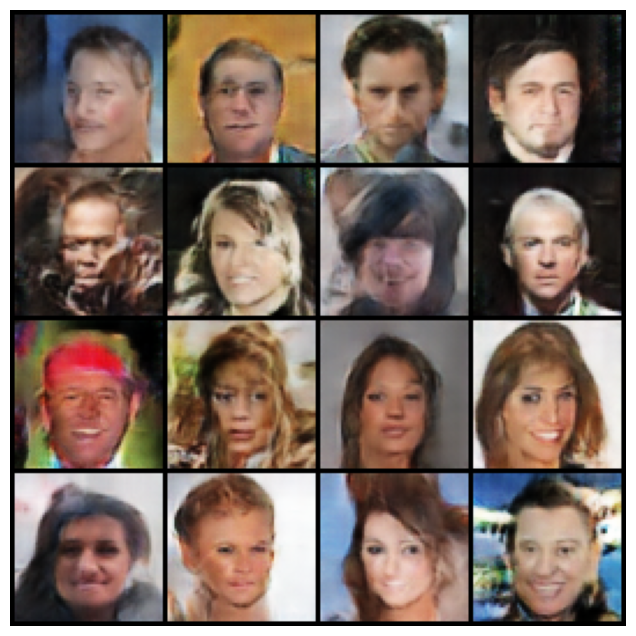

Epoch [8/20] | D Loss: 0.3968 | G Loss: 2.6912


100%|██████████| 1583/1583 [02:08<00:00, 12.29it/s]


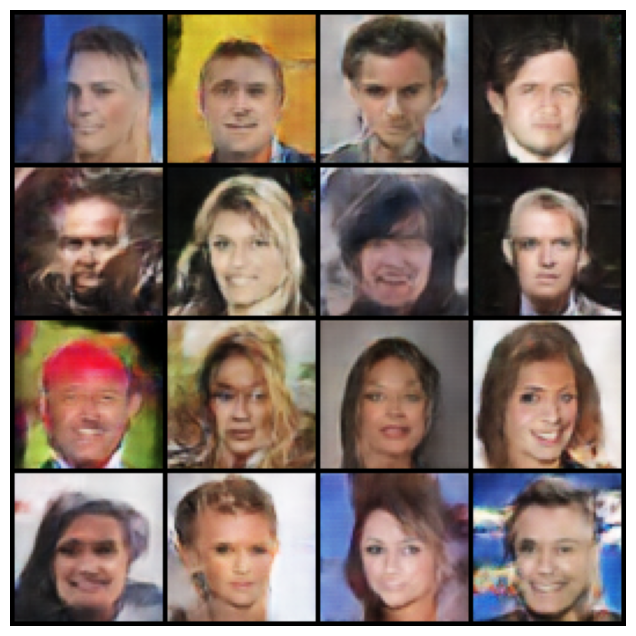

Epoch [9/20] | D Loss: 0.3167 | G Loss: 3.1132


100%|██████████| 1583/1583 [02:08<00:00, 12.35it/s]


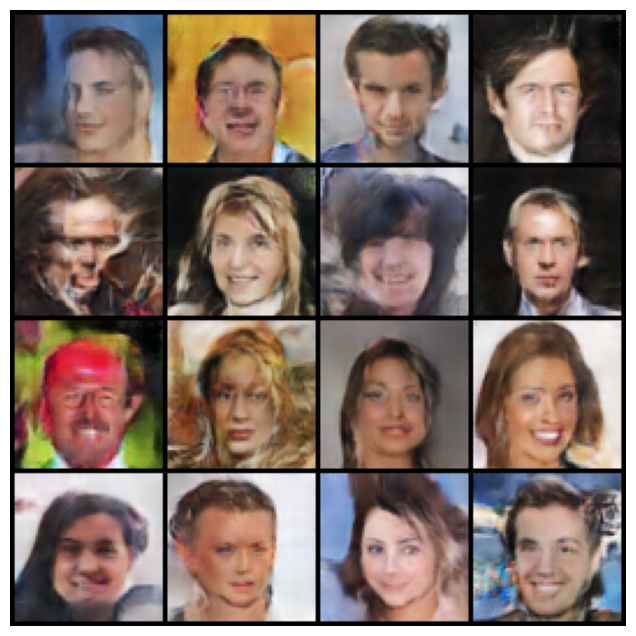

Epoch [10/20] | D Loss: 0.2824 | G Loss: 4.2400


100%|██████████| 1583/1583 [02:08<00:00, 12.35it/s]


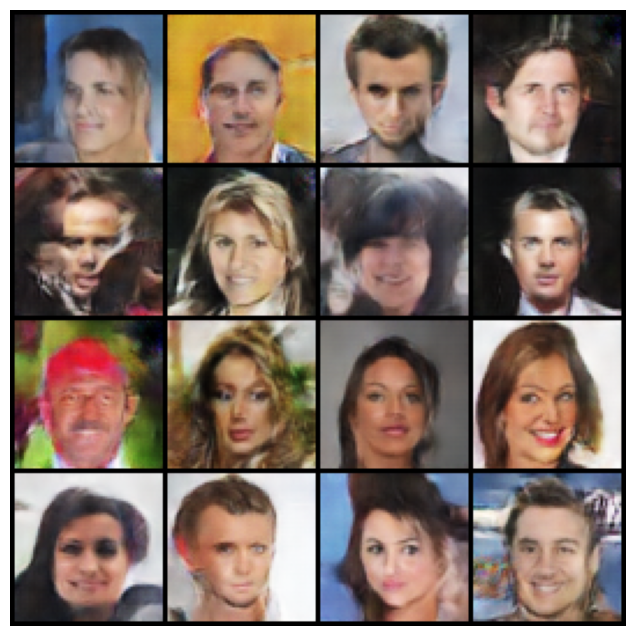

Epoch [11/20] | D Loss: 1.2196 | G Loss: 2.6219


100%|██████████| 1583/1583 [02:07<00:00, 12.43it/s]


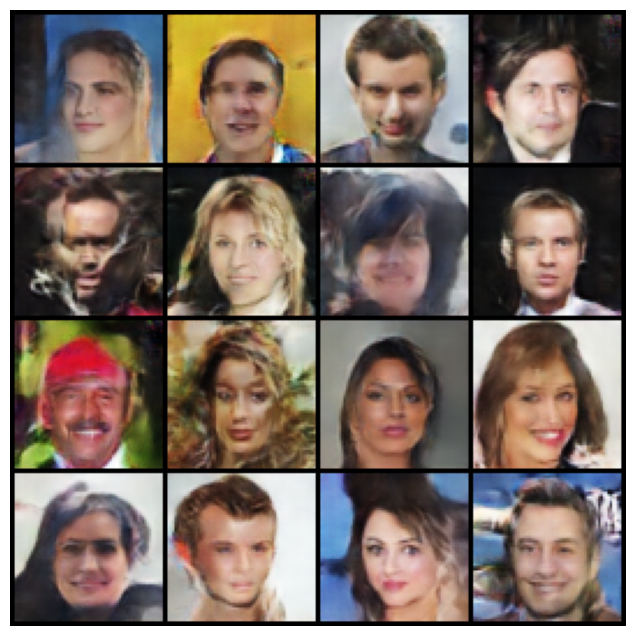

Epoch [12/20] | D Loss: 0.0383 | G Loss: 5.1571


100%|██████████| 1583/1583 [02:07<00:00, 12.42it/s]


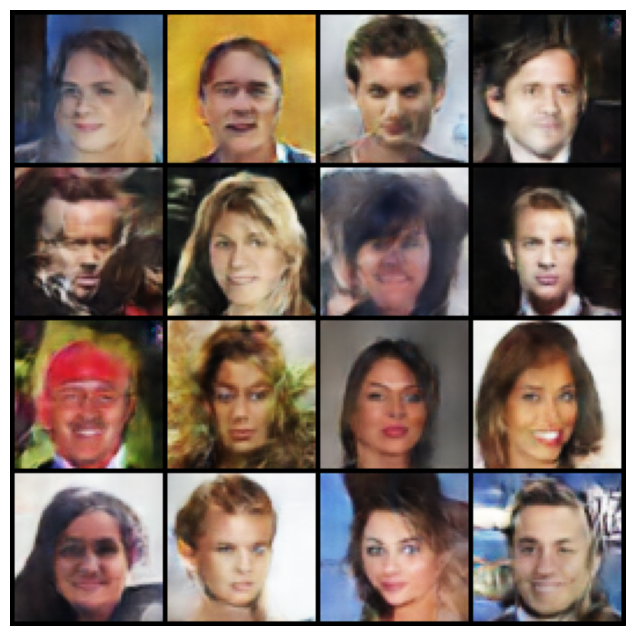

Epoch [13/20] | D Loss: 0.0408 | G Loss: 5.1063


100%|██████████| 1583/1583 [02:06<00:00, 12.49it/s]


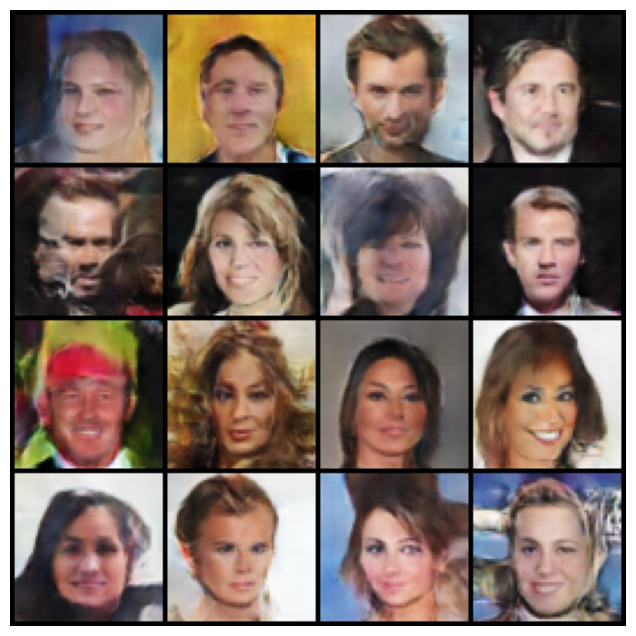

Epoch [14/20] | D Loss: 0.0660 | G Loss: 4.6878


100%|██████████| 1583/1583 [02:08<00:00, 12.30it/s]


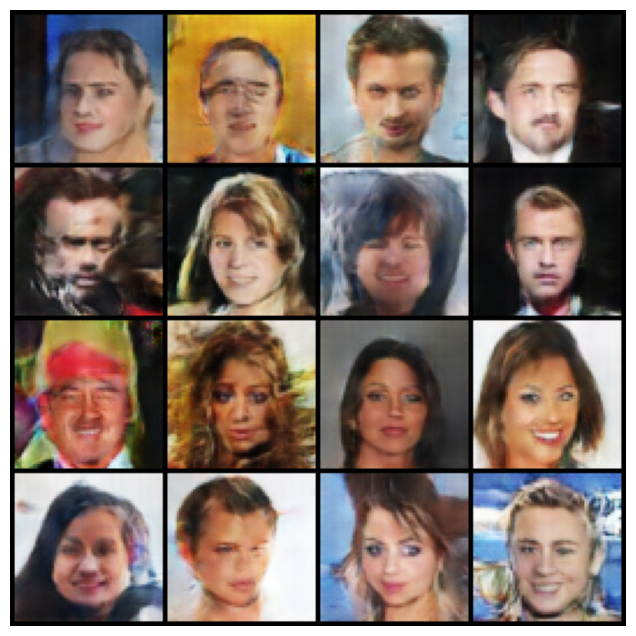

Epoch [15/20] | D Loss: 0.1650 | G Loss: 3.3905


100%|██████████| 1583/1583 [02:07<00:00, 12.39it/s]


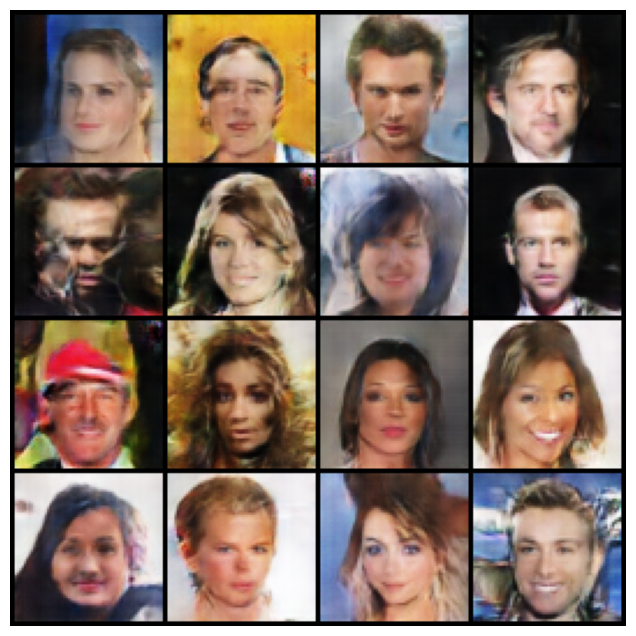

Epoch [16/20] | D Loss: 0.1883 | G Loss: 3.5335


100%|██████████| 1583/1583 [02:09<00:00, 12.22it/s]


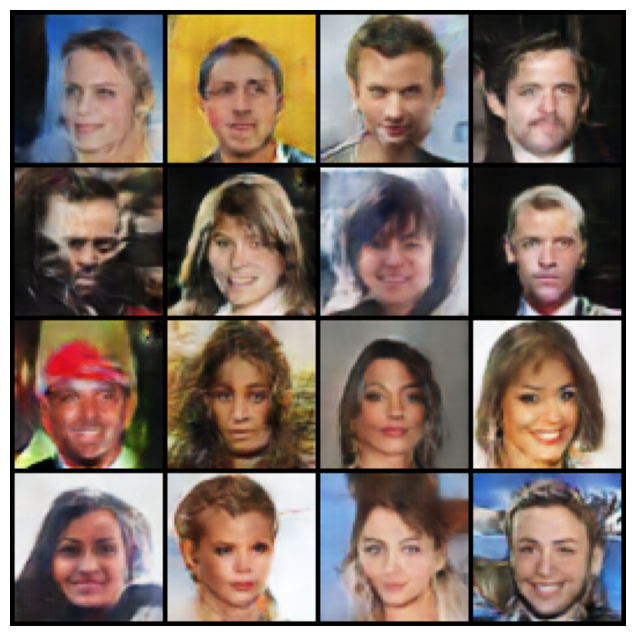

Epoch [17/20] | D Loss: 0.5902 | G Loss: 1.0901


100%|██████████| 1583/1583 [02:08<00:00, 12.31it/s]


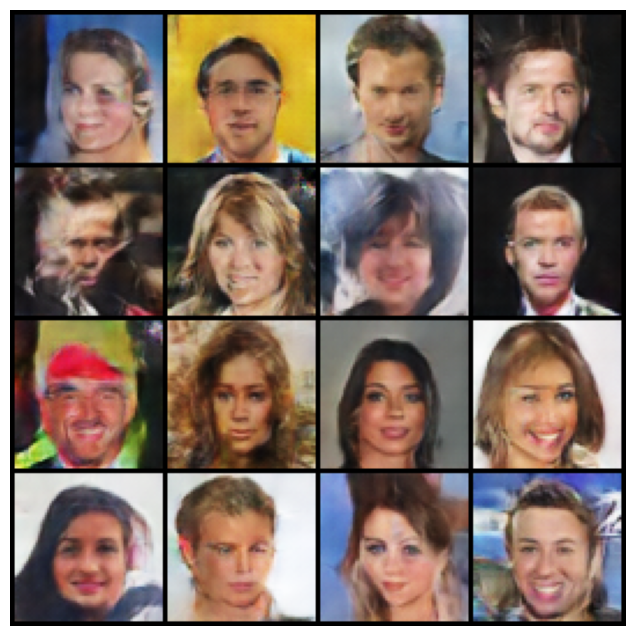

Epoch [18/20] | D Loss: 3.0712 | G Loss: 7.5863


100%|██████████| 1583/1583 [02:08<00:00, 12.36it/s]


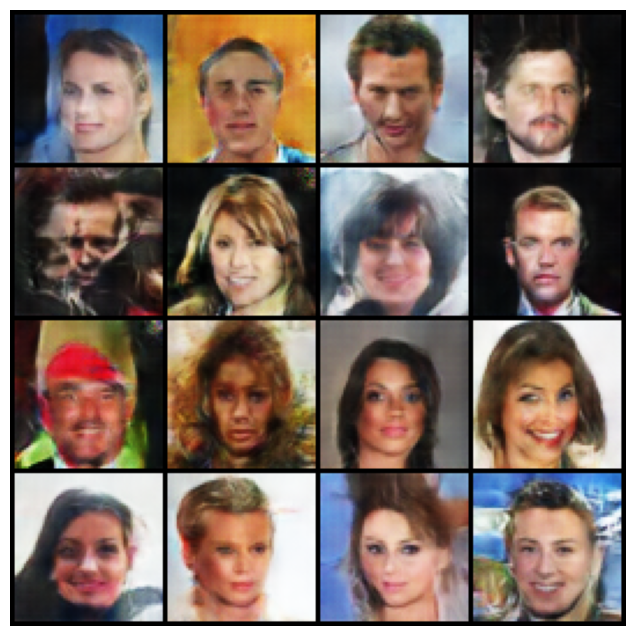

Epoch [19/20] | D Loss: 0.5089 | G Loss: 2.2777


100%|██████████| 1583/1583 [02:08<00:00, 12.36it/s]


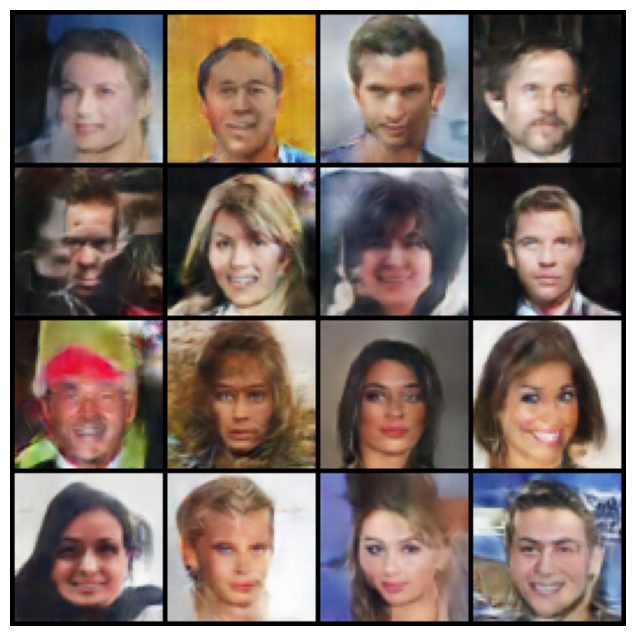

Epoch [20/20] | D Loss: 0.1675 | G Loss: 7.4986


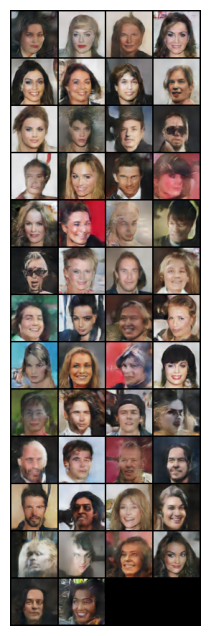

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from tqdm import tqdm
import os

# Set dataset path (adjust if necessary)
dataset_path = "/kaggle/input/celeba-dataset/"

# Define image transformations
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])  # Normalize between -1 and 1
])

# Load dataset
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=128, shuffle=True, num_workers=4)

# Function to display images
def show_images(images, num_images=16):
    images = images[:num_images]
    grid = make_grid(images, nrow=4, normalize=True)
    plt.figure(figsize=(8, 8))
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis("off")
    plt.show()

# Display sample images
sample_images, _ = next(iter(dataloader))
show_images(sample_images)

# Define the Generator class
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z.view(-1, 100, 1, 1))

# Define the Discriminator class
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img).view(-1, 1)

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize models
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Define loss function and optimizers
criterion = nn.BCELoss()
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Generate fixed noise for consistent progress tracking
fixed_noise = torch.randn(16, 100, 1, 1, device=device)

# Number of epochs
num_epochs = 20

# Training loop
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(tqdm(dataloader)):
        real_images = real_images.to(device)
        batch_size = real_images.size(0)

        real_labels = torch.ones(batch_size, 1, device=device)
        fake_labels = torch.zeros(batch_size, 1, device=device)

        # Train Discriminator
        optimizer_D.zero_grad()

        real_loss = criterion(discriminator(real_images), real_labels)
        fake_images = generator(torch.randn(batch_size, 100, 1, 1, device=device))
        fake_loss = criterion(discriminator(fake_images.detach()), fake_labels)

        d_loss = real_loss + fake_loss
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        g_loss = criterion(discriminator(fake_images), real_labels)
        g_loss.backward()
        optimizer_G.step()

    # Generate samples every epoch
    with torch.no_grad():
        generated_images = generator(fixed_noise).cpu()
        show_images(generated_images)

    print(f"Epoch [{epoch+1}/{num_epochs}] | D Loss: {d_loss.item():.4f} | G Loss: {g_loss.item():.4f}")

# Function to generate and display new samples
def generate_samples(generator, num_samples=50):
    noise = torch.randn(num_samples, 100, 1, 1, device=device)
    with torch.no_grad():
        samples = generator(noise).cpu()
    show_images(samples, num_images=50)

# Generate new samples
generate_samples(generator)
